In [36]:
from tdw_dataset import *
import glob
from model import *
import torch
import numpy as np
from tqdm.notebook import tqdm

import matplotlib.pyplot as plt
from PIL import Image as Image, ImageEnhance
from miou_metric import SegmentationMetrics

In [55]:
# Hyperparameters.
seed = 0
batch_size = 1
num_slots = 5
num_iterations = 5

In [56]:
def load_latest(model_dir, run_name):
    checkpoint_dir = os.path.join(model_dir, run_name)
    checkpoint_path = os.path.join(checkpoint_dir, "checkpoint_step=*.pt")
    checkpoints = glob.glob(checkpoint_path)
    if len(checkpoints) == 0:
        raise ValueError(f"No checkpoints detected at path {checkpoint_path}")
    sorted_checkpoints = sorted(checkpoints, key=lambda x: int(x.split(".")[0].split("=")[-1]))
    print("Loading checkpoint: ", sorted_checkpoints[-1])
    return torch.load(sorted_checkpoints[-1])

In [63]:
resolution = (512, 512)
model = SlotAttentionAutoEncoder(resolution, num_slots, num_iterations, 64, output_channels=4)
run_name = "recon=rgb_all_k=7"
ckpt = load_latest("/om2/user/yyf/ECCV_2022/models/slot-attention/", run_name)
model.load_state_dict(ckpt["state_dict"])

Loading checkpoint:  /om2/user/yyf/ECCV_2022/models/slot-attention/recon=rgb_all_k=7/checkpoint_step=90000.pt


<All keys matched successfully>

In [64]:
dataset = TDWDataset("/om2/user/yyf/tdw_playroom_small", target="raft_motion", training=False)

0it [00:00, ?it/s]

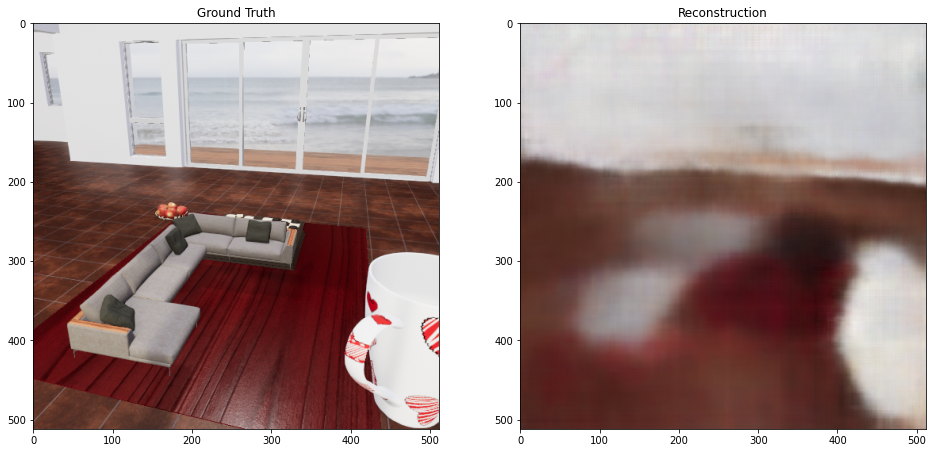

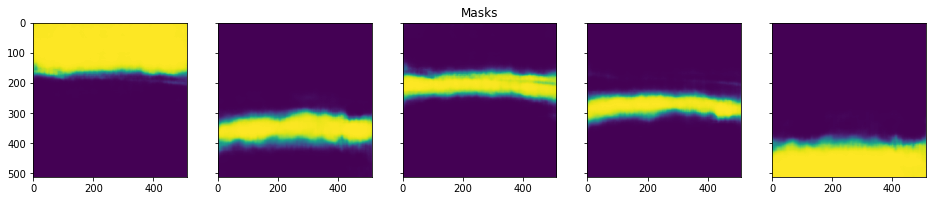

Mean IOU: [0.09593967] Best IOUs:  [array([0.14885309, 0.00736478, 0.19538359, 0.03215723])]


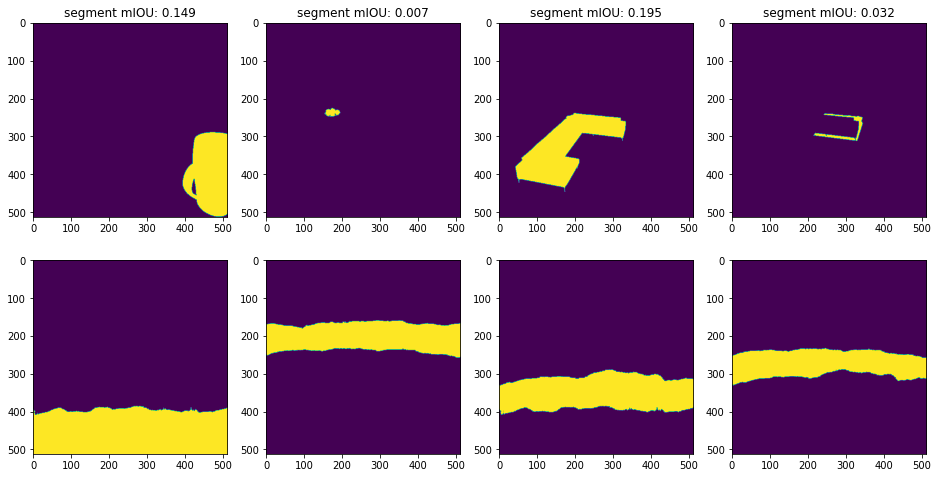

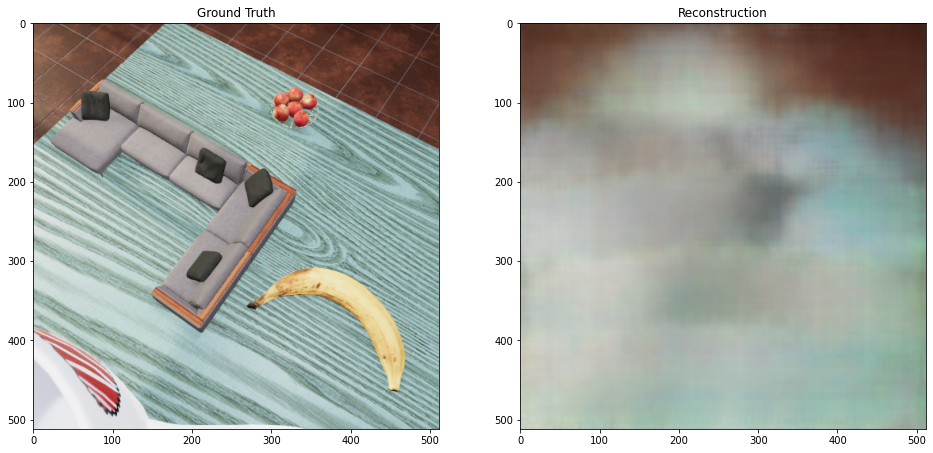

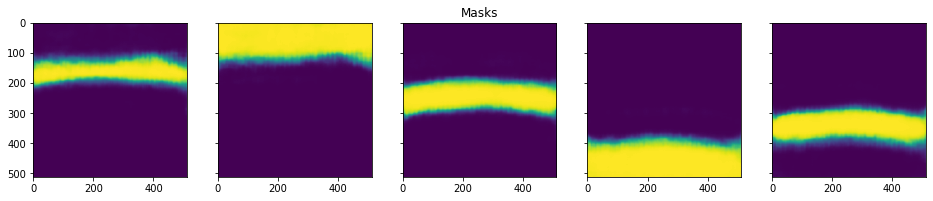

Mean IOU: [0.14159343] Best IOUs:  [array([0.12663637, 0.19607681, 0.02292103, 0.22073951])]


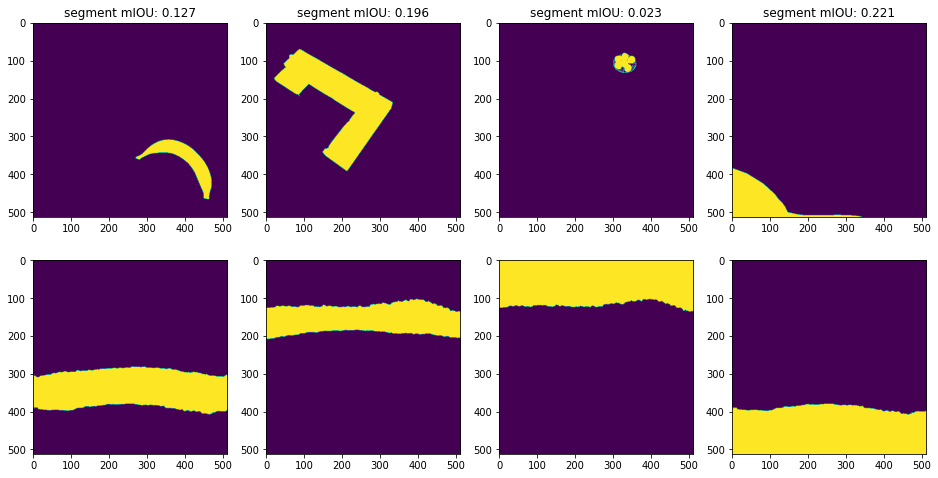

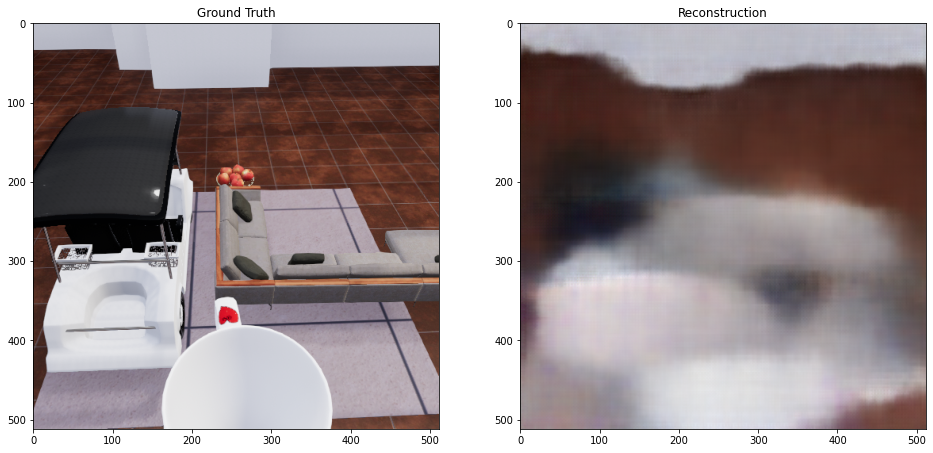

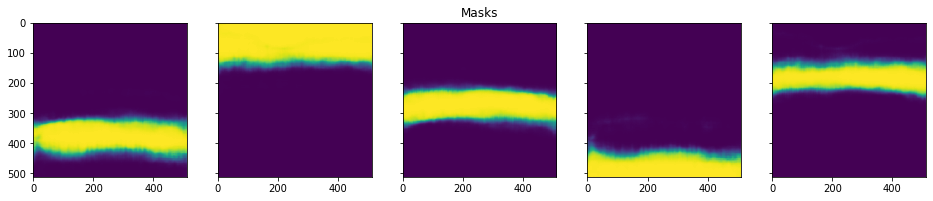

Mean IOU: [0.21526598] Best IOUs:  [array([0.37340733, 0.02042013, 0.26696825, 0.20026821])]


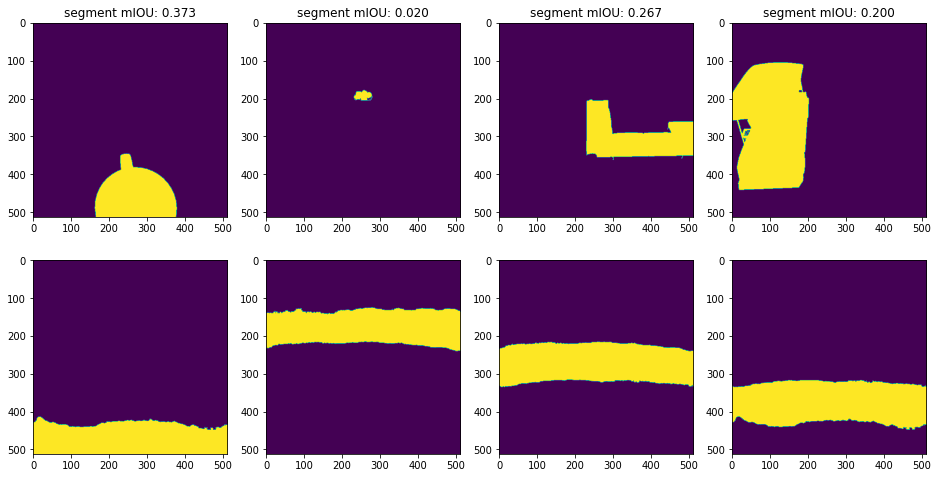

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


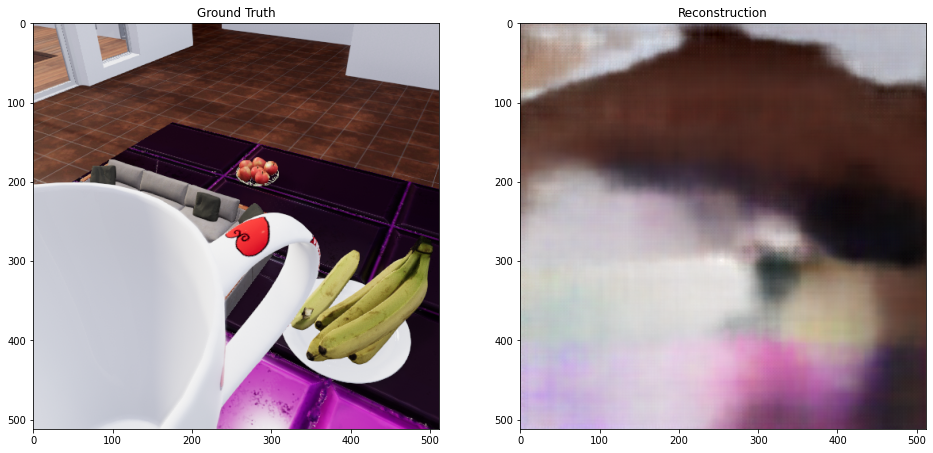

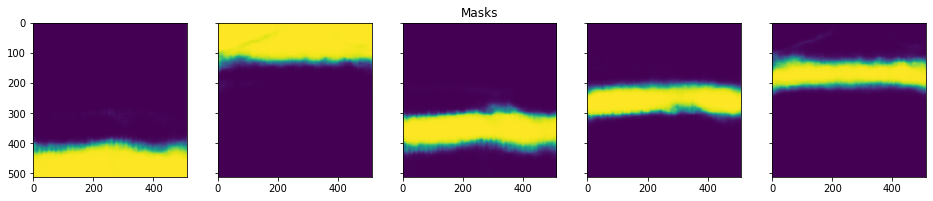

Mean IOU: [0.15614714] Best IOUs:  [array([0.25033745, 0.24587396, 0.03240872, 0.09596843])]


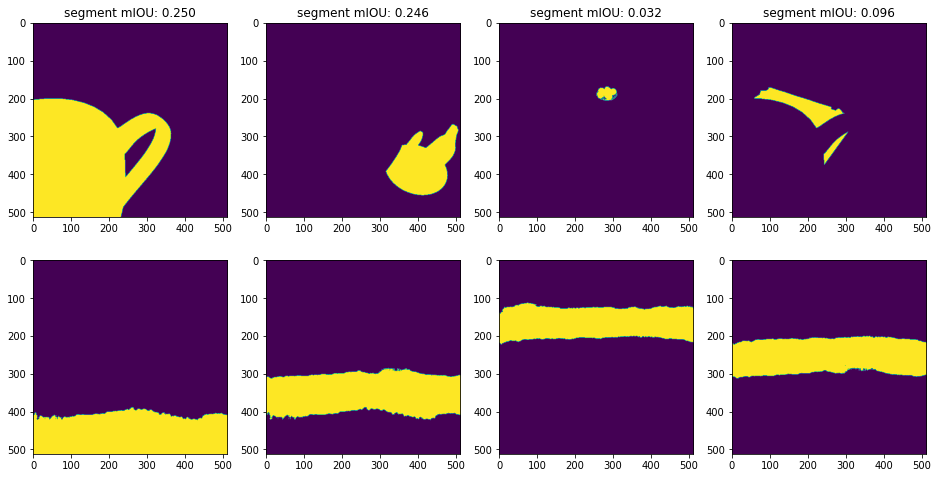

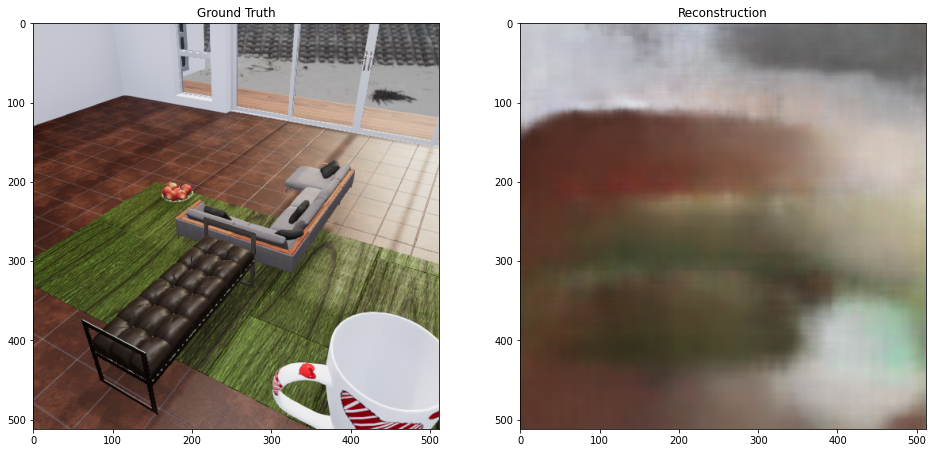

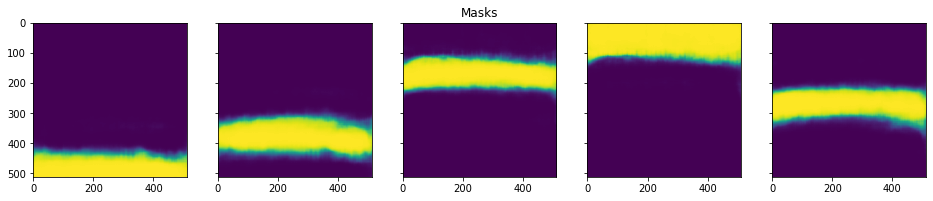

Mean IOU: [0.16310092] Best IOUs:  [array([0.16390978, 0.25631478, 0.22371997, 0.00845913])]


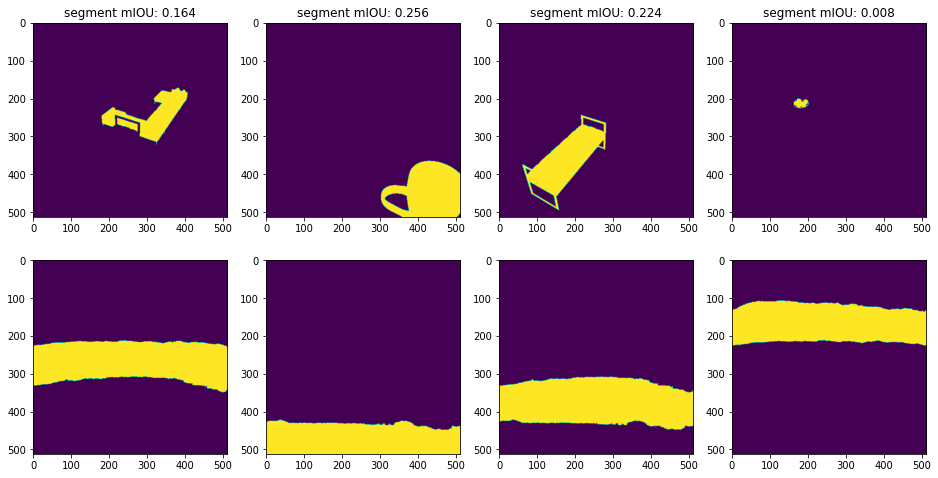

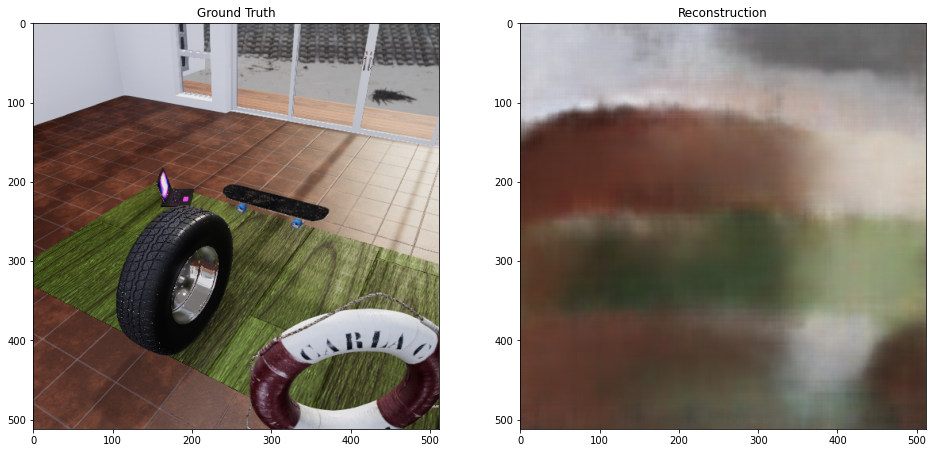

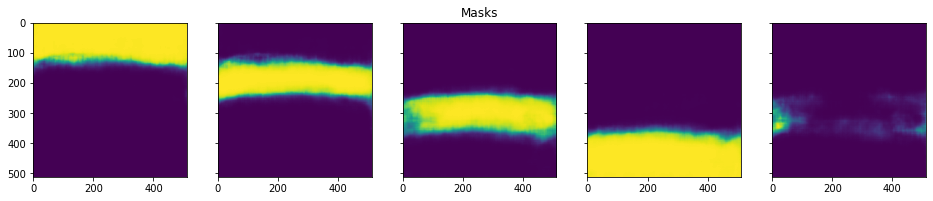

Mean IOU: [0.13905762] Best IOUs:  [array([0.04171144, 0.29133818, 0.22318088, 0.        ])]


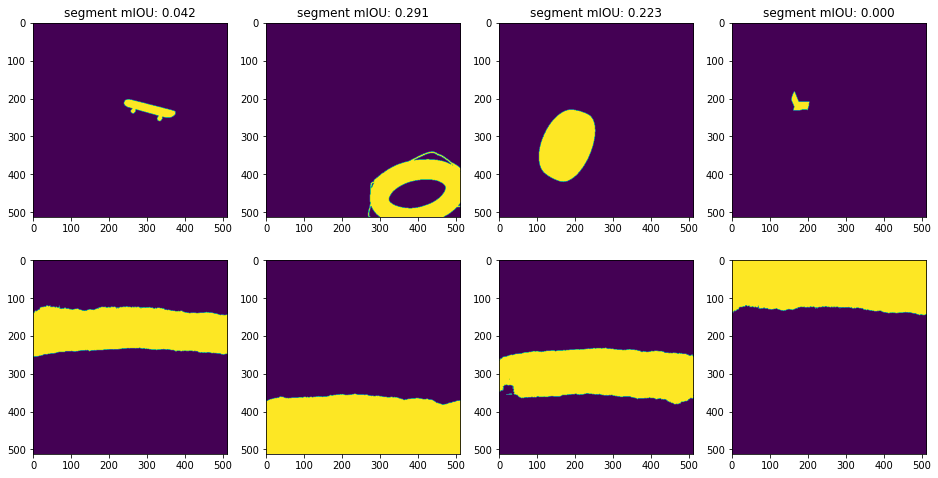

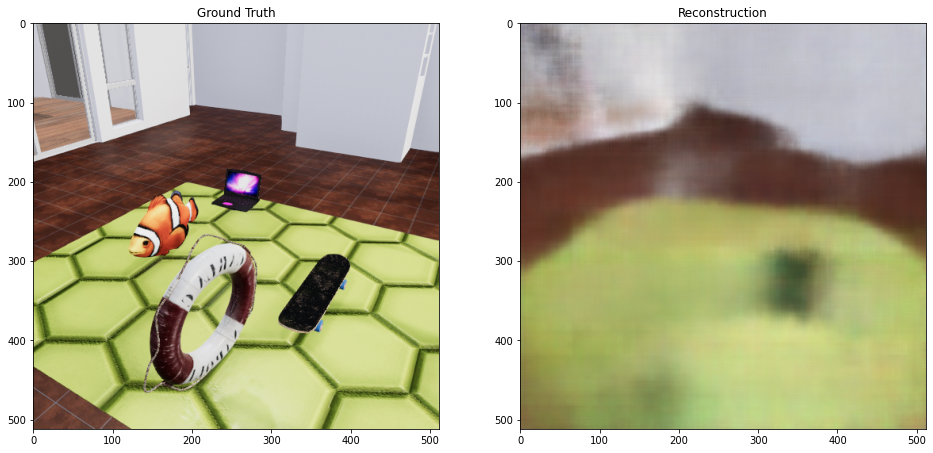

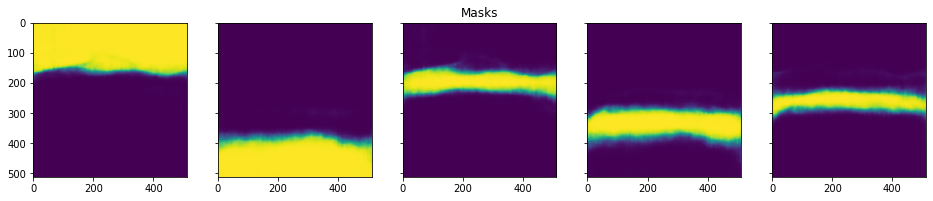

Mean IOU: [0.08511226] Best IOUs:  [array([0.04862064, 0.12960345, 0.08021405, 0.08201091])]


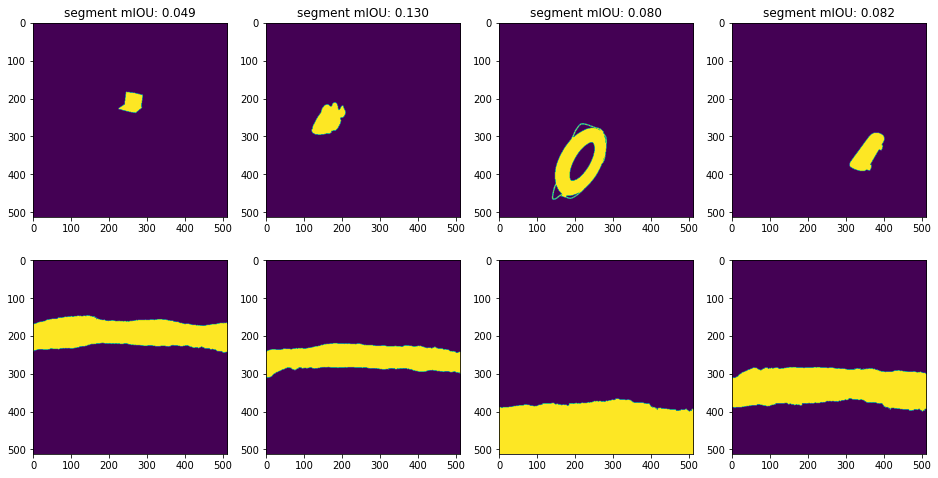

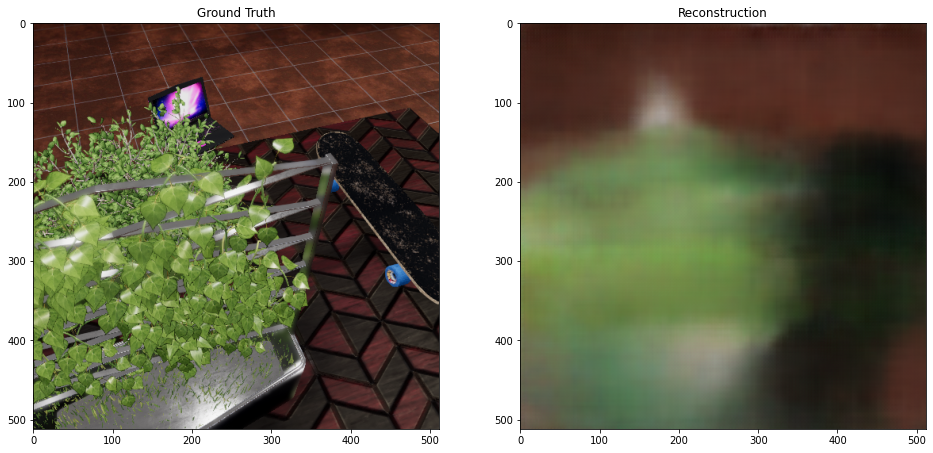

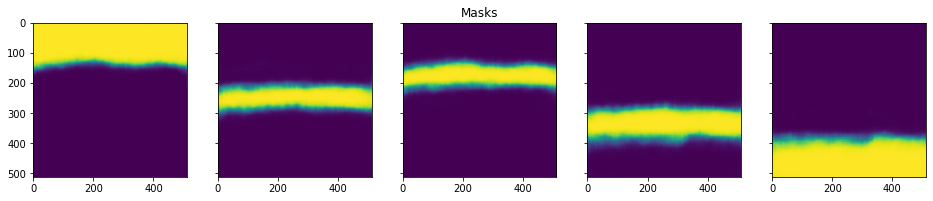

Mean IOU: [0.1529068] Best IOUs:  [array([0.13597496, 0.28291035, 0.03983511])]


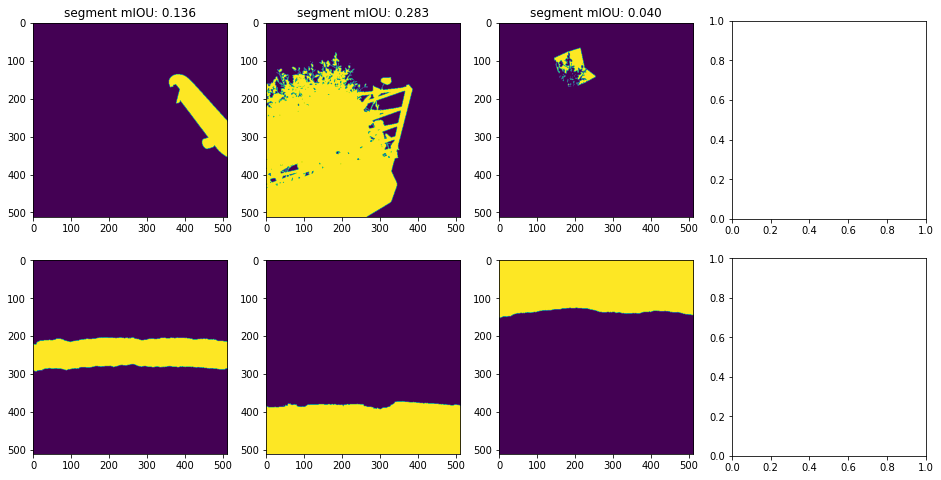

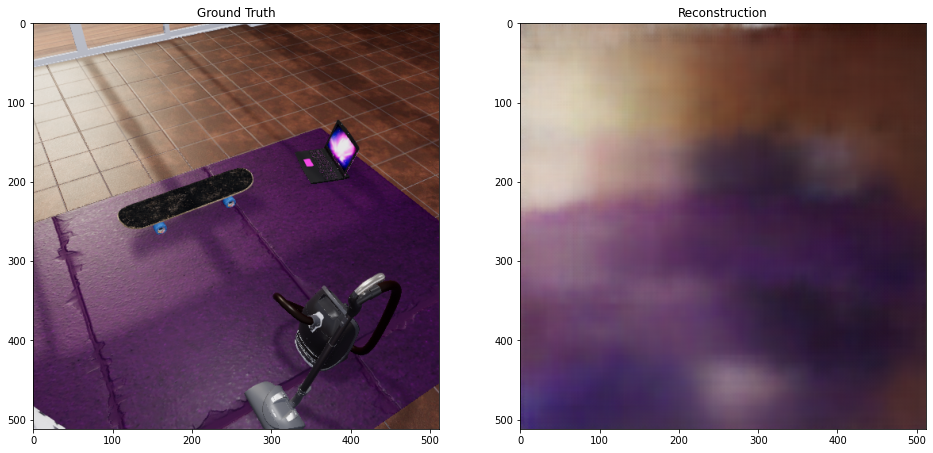

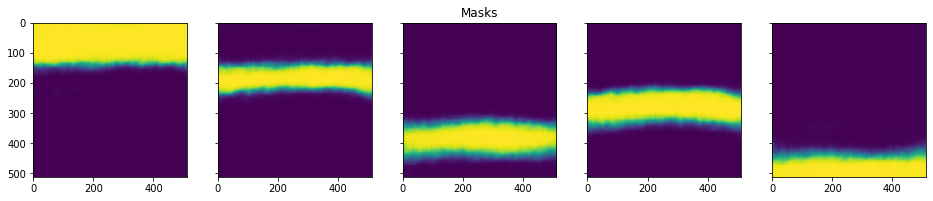

Mean IOU: [0.07475173] Best IOUs:  [array([0.07644756, 0.15014406, 0.01572319, 0.05669212])]


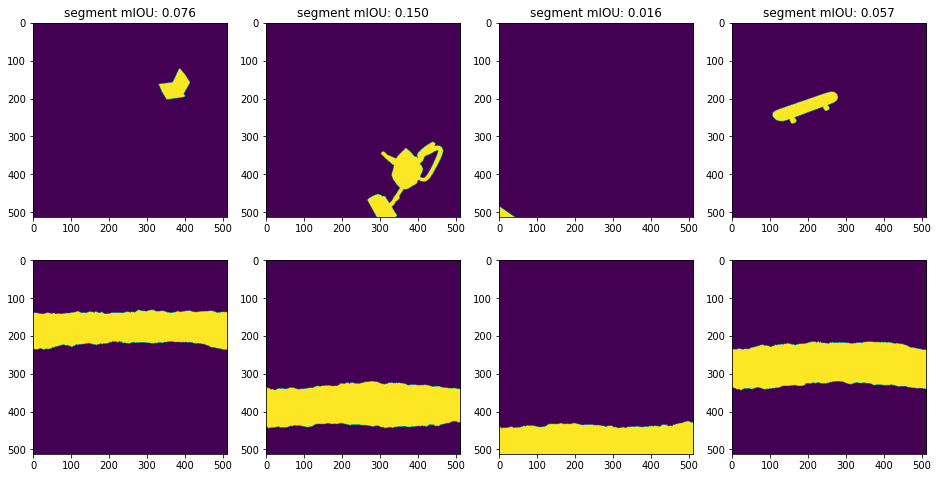

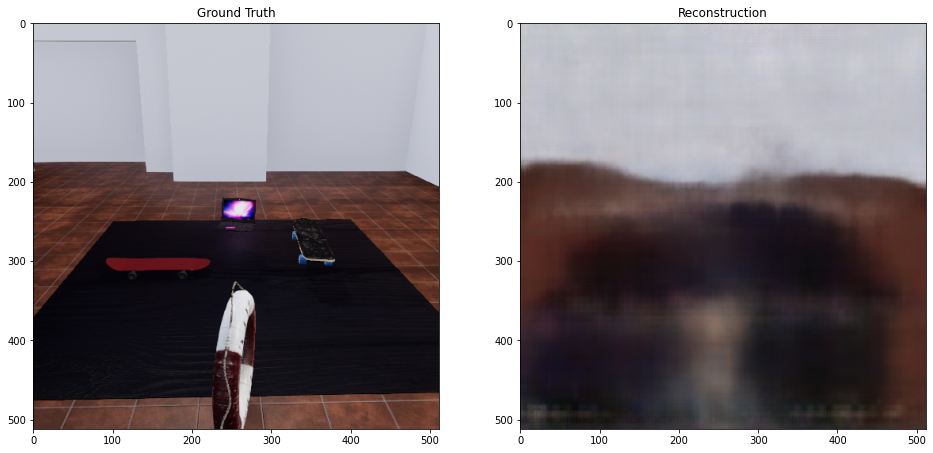

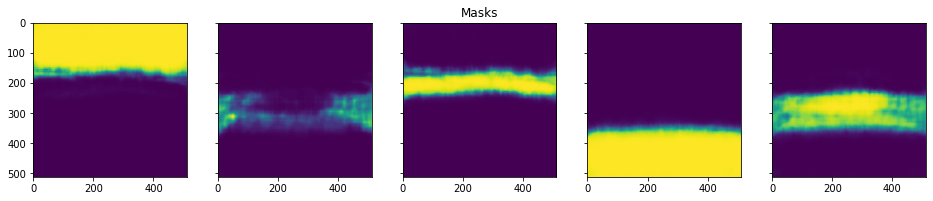

Mean IOU: [0.03362995] Best IOUs:  [array([0.03824704, 0.0068648 , 0.        , 0.08940797])]


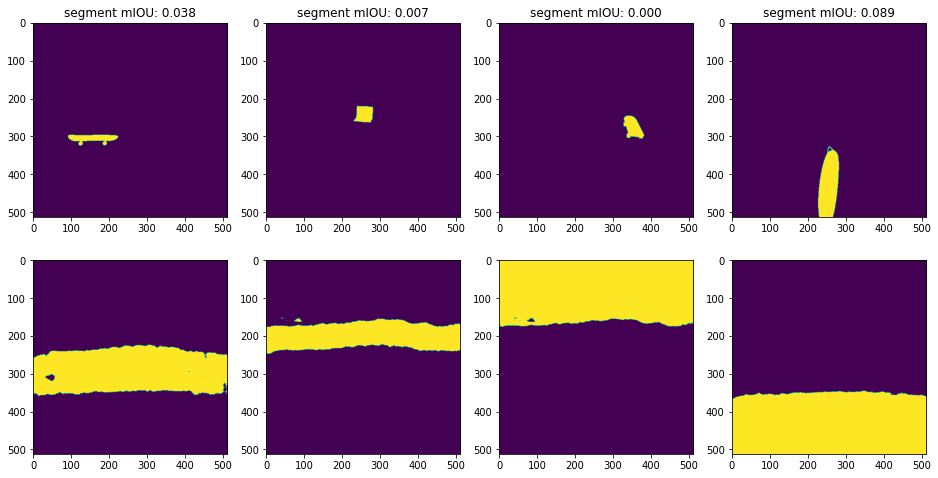

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


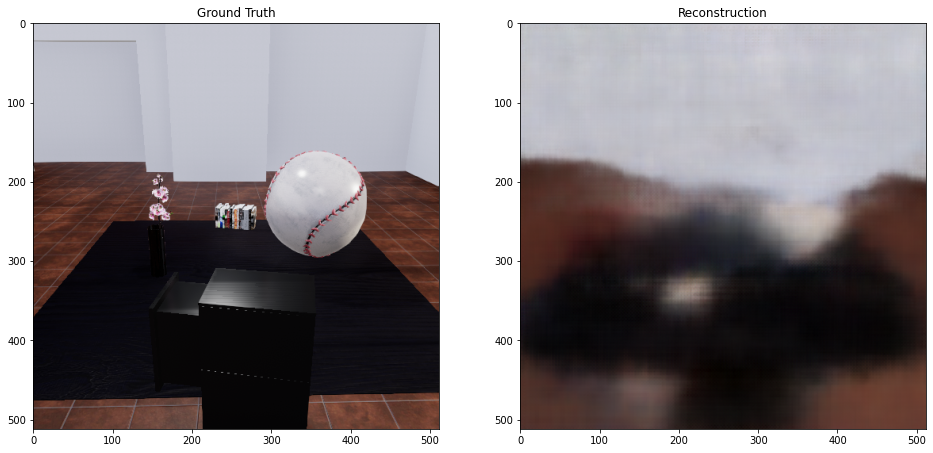

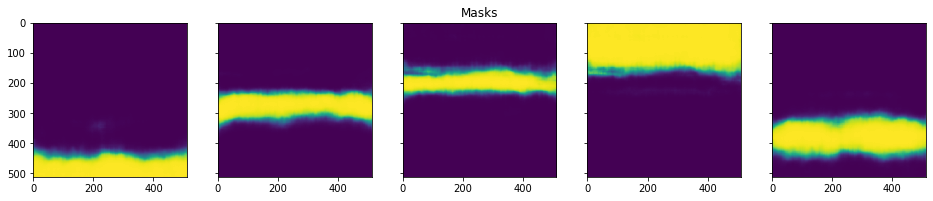

Mean IOU: [0.13471672] Best IOUs:  [array([0.00611247, 0.32508102, 0.03485701, 0.17281638])]


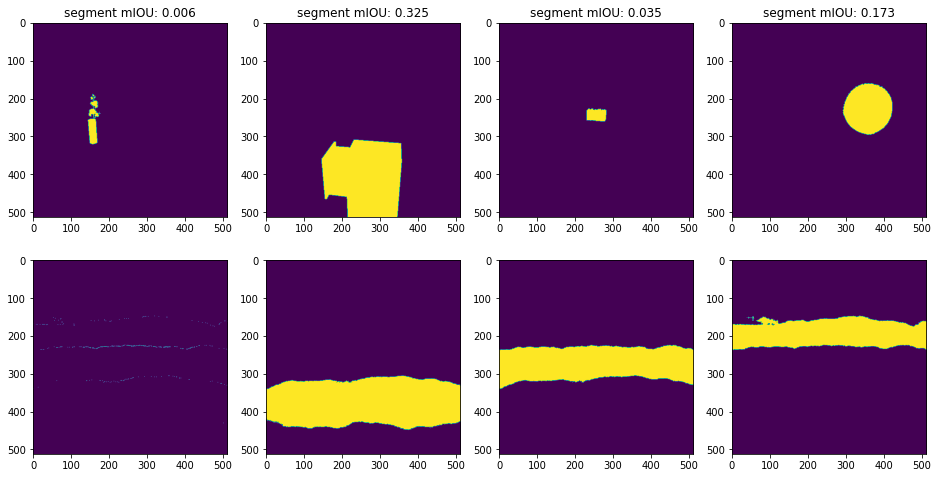

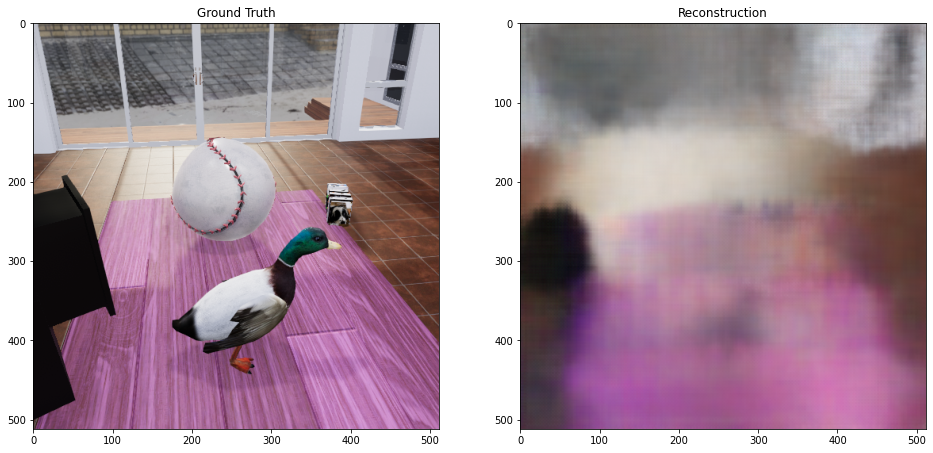

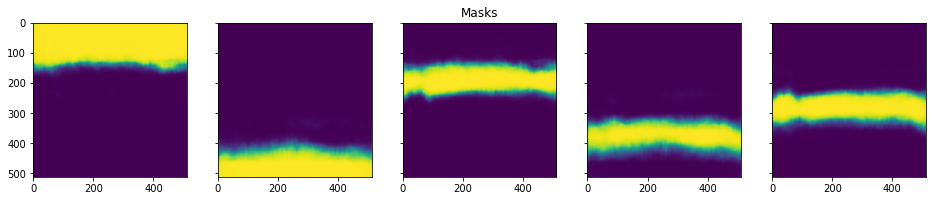

Mean IOU: [0.12526653] Best IOUs:  [array([0.13638932, 0.17749189, 0.00946687, 0.17771806])]


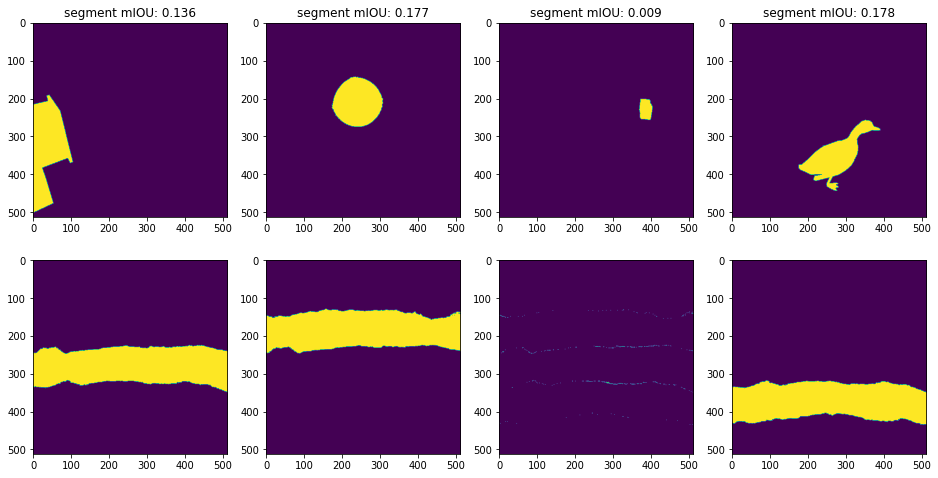

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


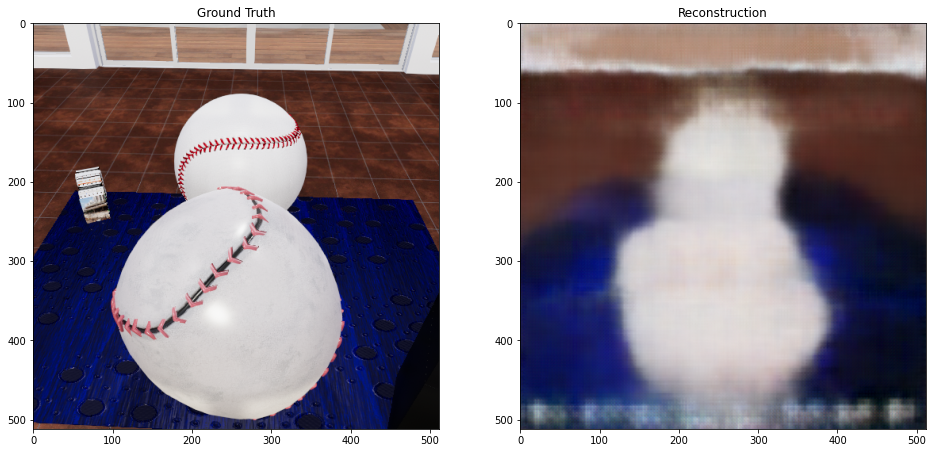

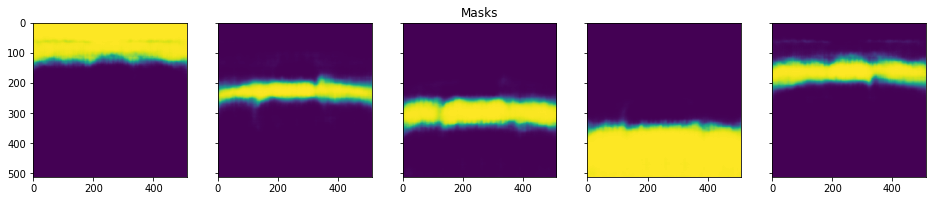

Mean IOU: [0.15970233] Best IOUs:  [array([1.20644239e-04, 2.62888014e-01, 3.27482581e-01, 4.83180620e-02])]


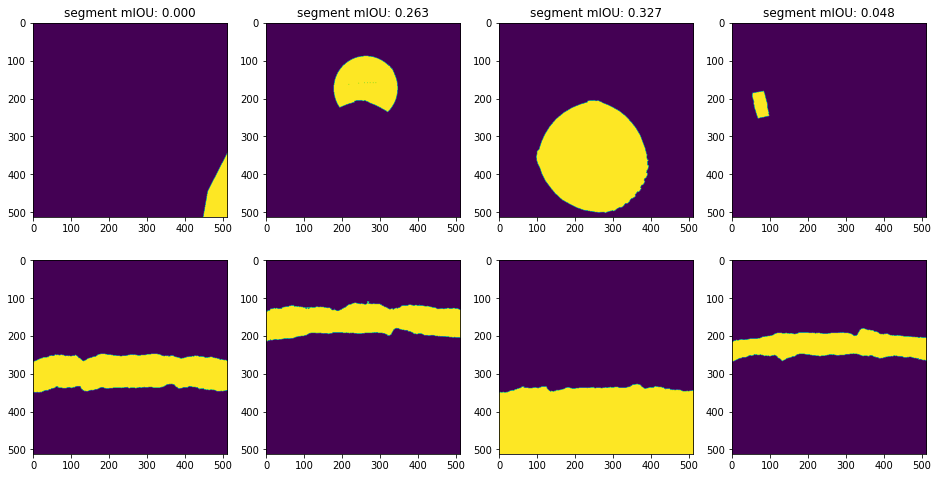

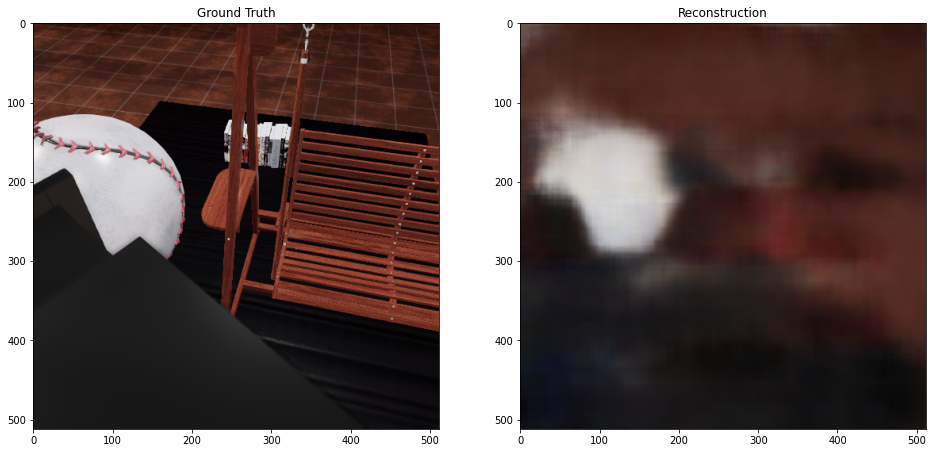

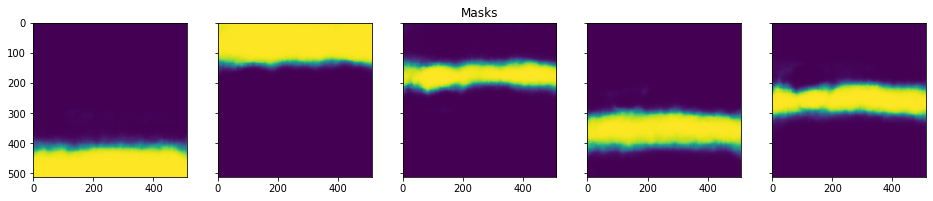

Mean IOU: [0.23538011] Best IOUs:  [array([0.41379702, 0.00552083, 0.26152834, 0.26067424])]


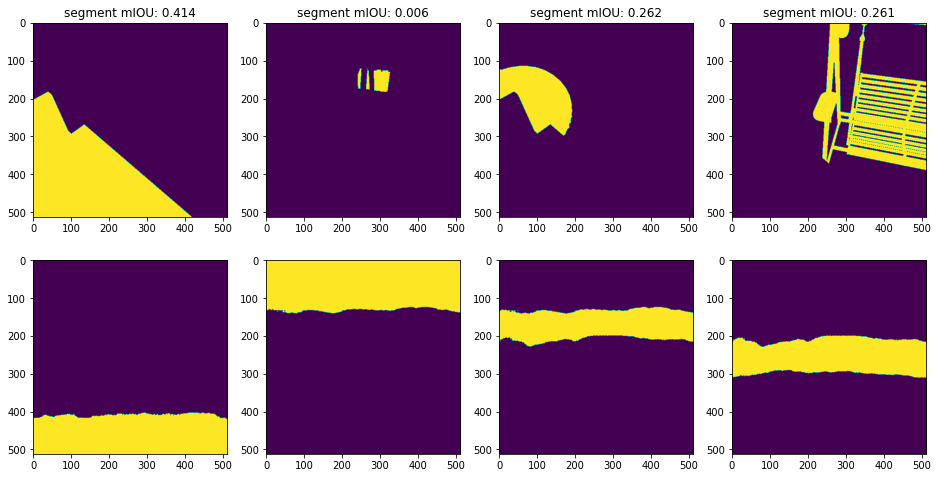

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


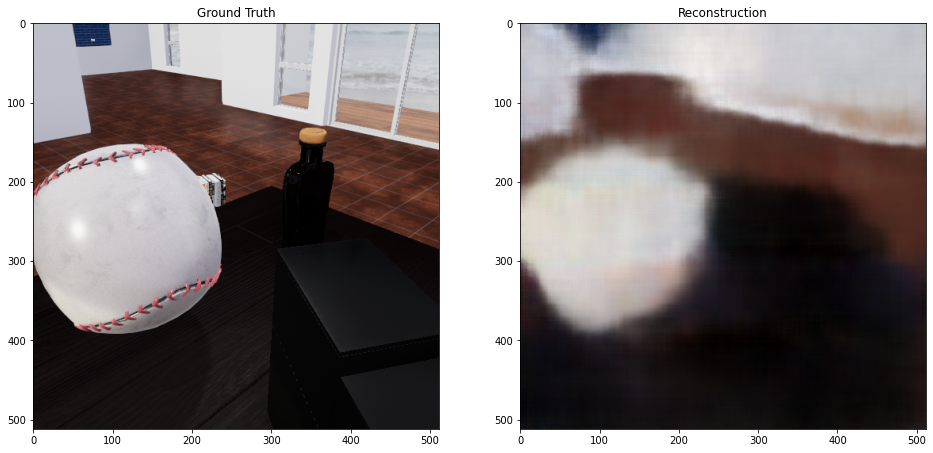

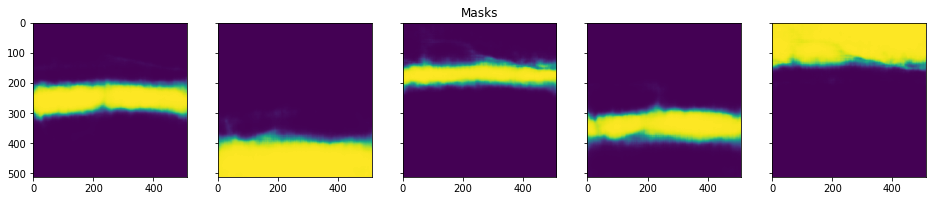

Mean IOU: [0.17847302] Best IOUs:  [array([0.02027027, 0.31289813, 0.07684512, 0.30387855])]


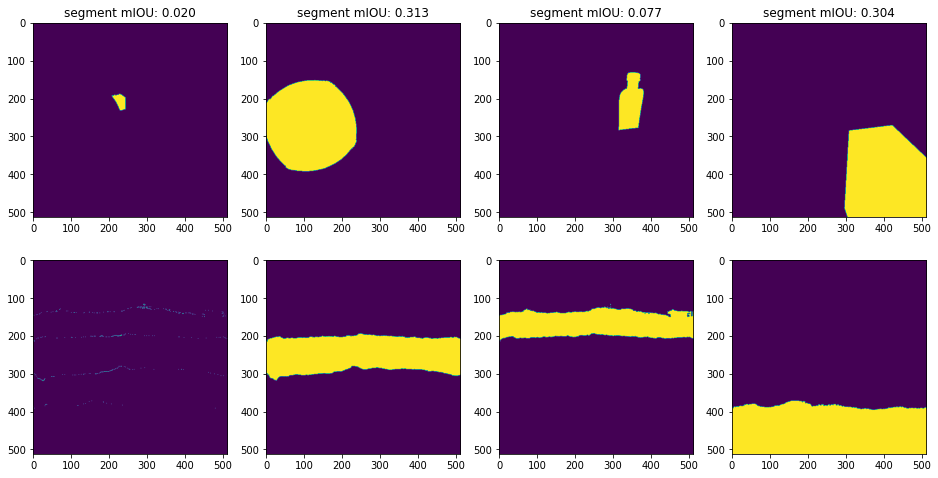

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


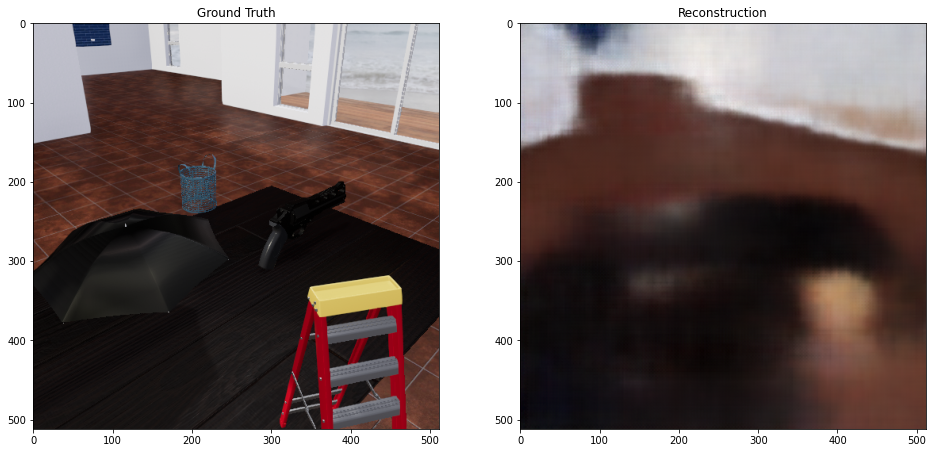

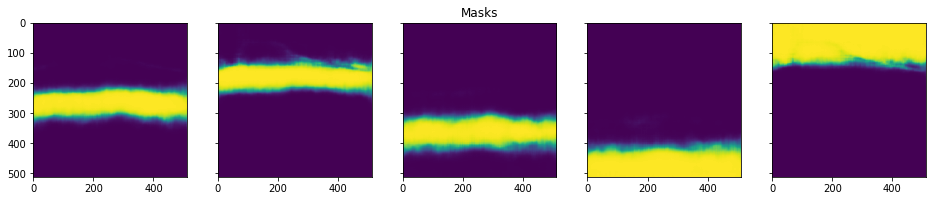

Mean IOU: [0.1112579] Best IOUs:  [array([0.0321954 , 0.25176701, 0.15836444, 0.00270474])]


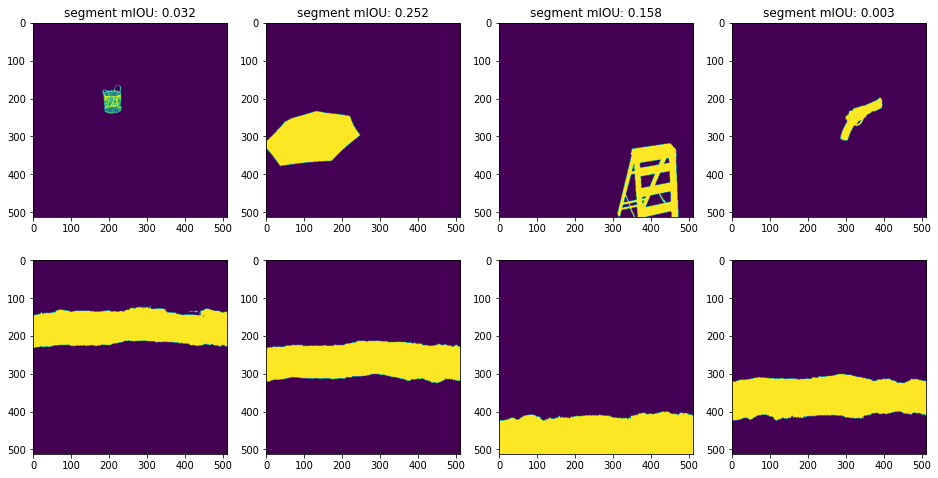

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


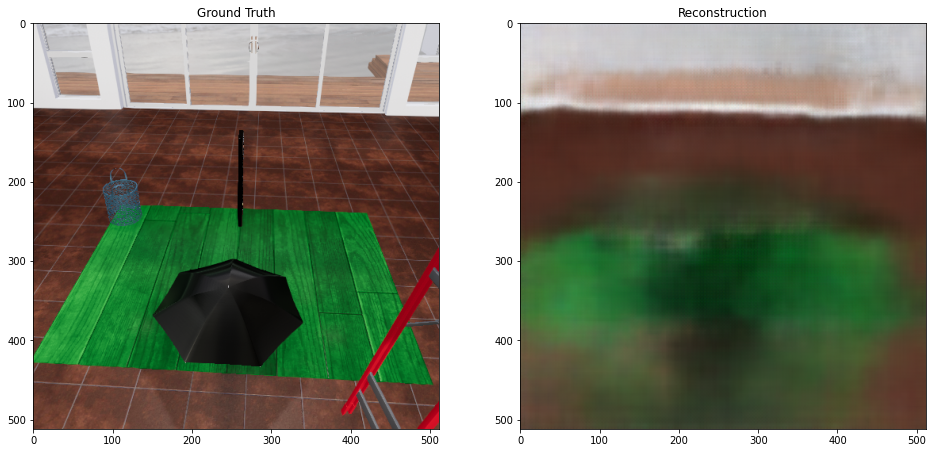

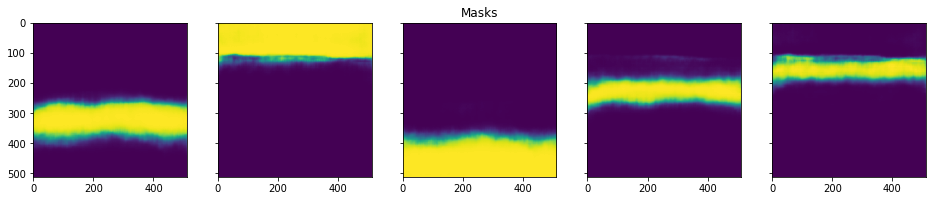

Mean IOU: [0.06244156] Best IOUs:  [array([0.03998419, 0.04611021, 0.00925872, 0.1544131 ])]


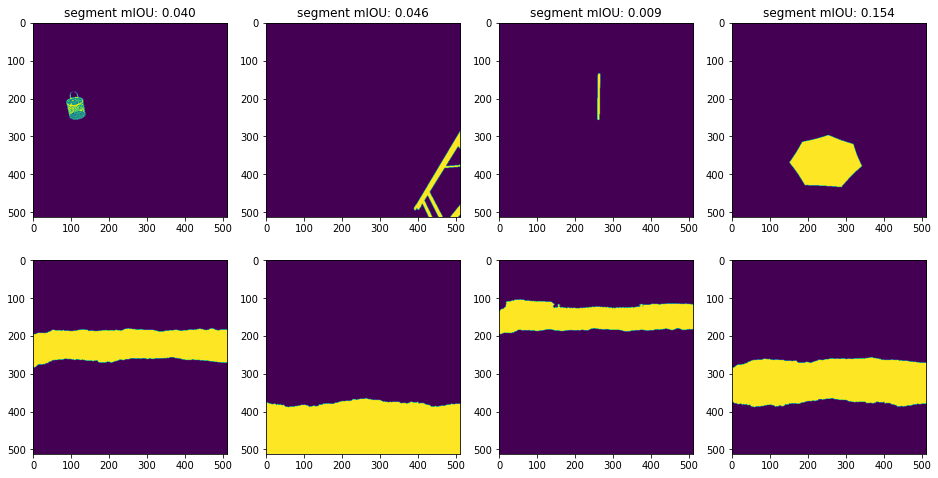

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


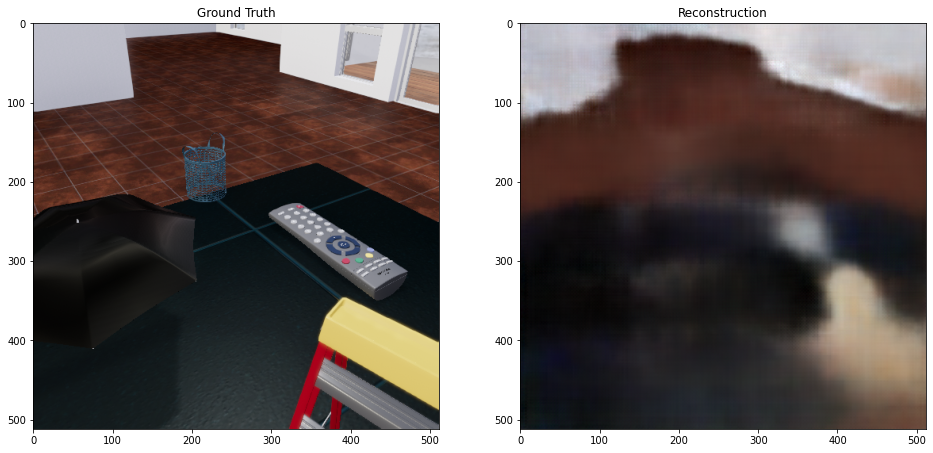

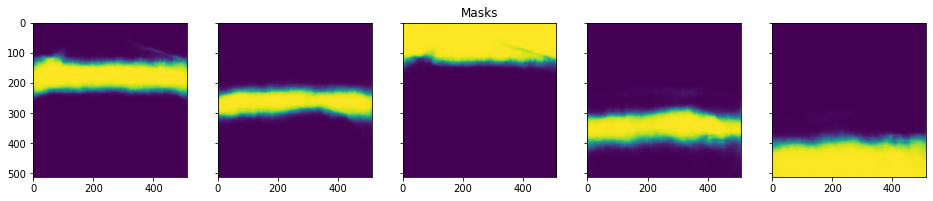

Mean IOU: [0.16587548] Best IOUs:  [array([0.12570189, 0.047591  , 0.25789785, 0.23231119])]


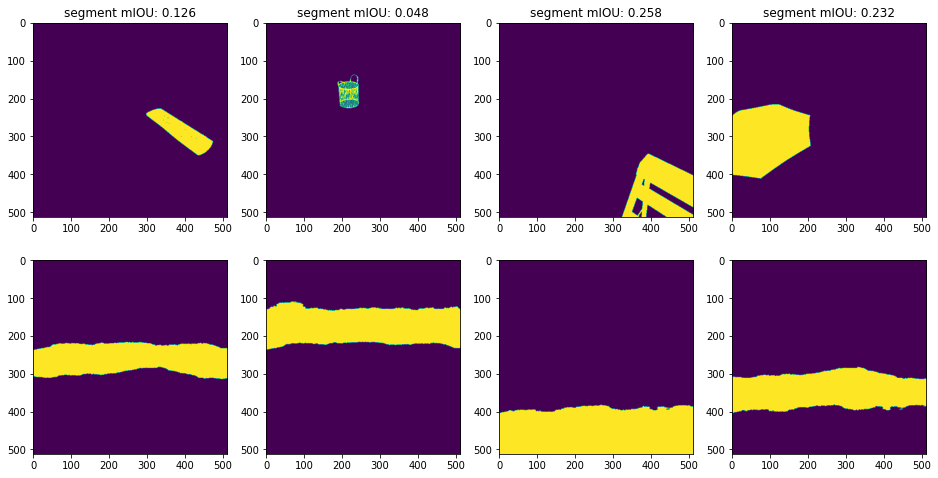

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


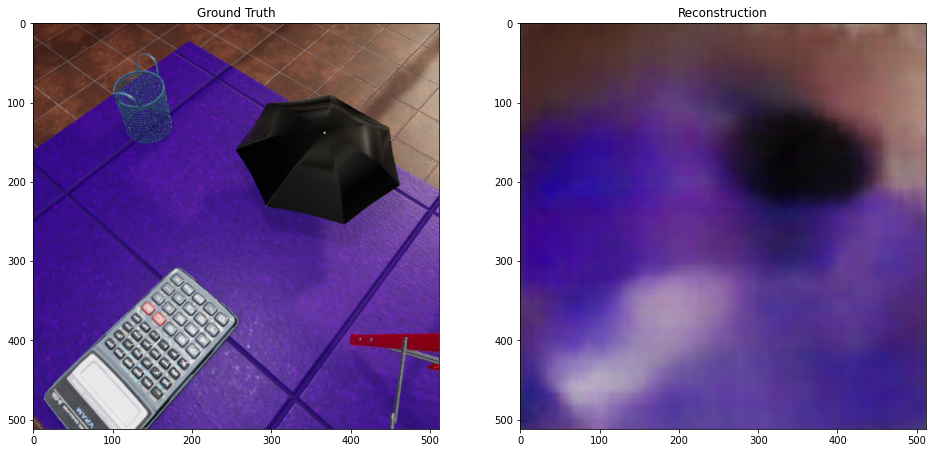

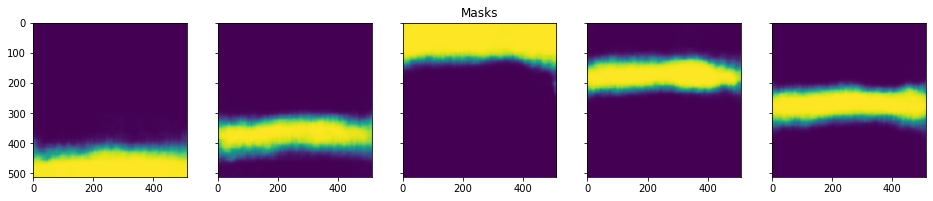

Mean IOU: [0.1630922] Best IOUs:  [array([0.22855774, 0.04457757, 0.03885132, 0.34038216])]


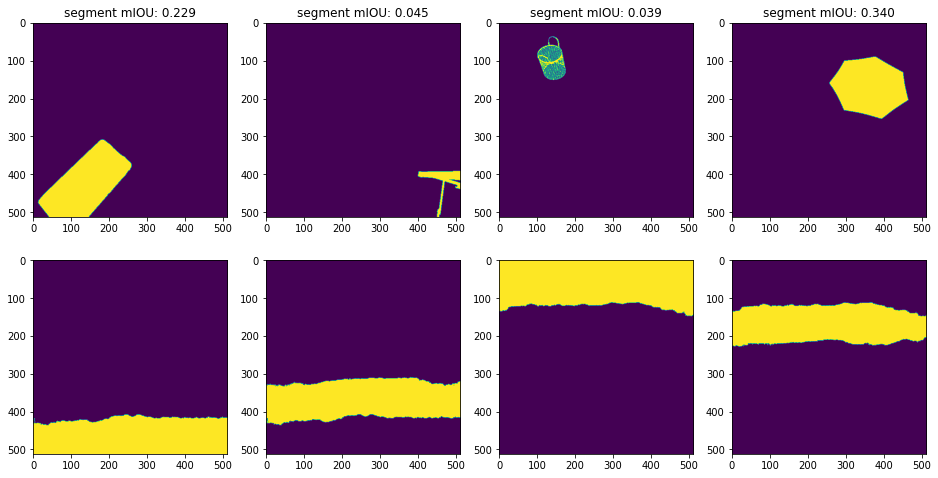

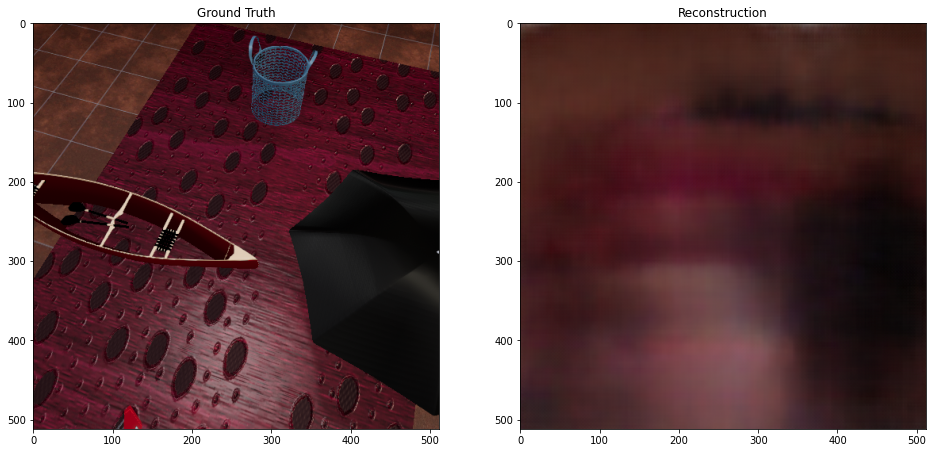

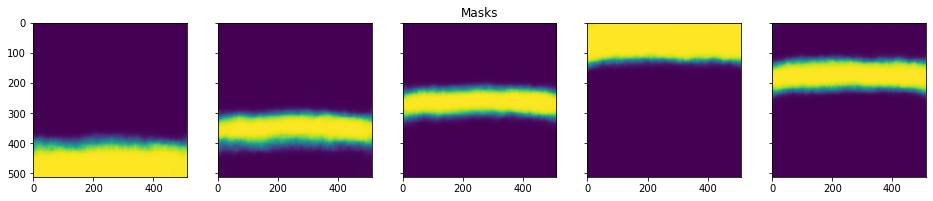

Mean IOU: [0.0930808] Best IOUs:  [array([0.20963475, 0.00907225, 0.06225481, 0.09136139])]


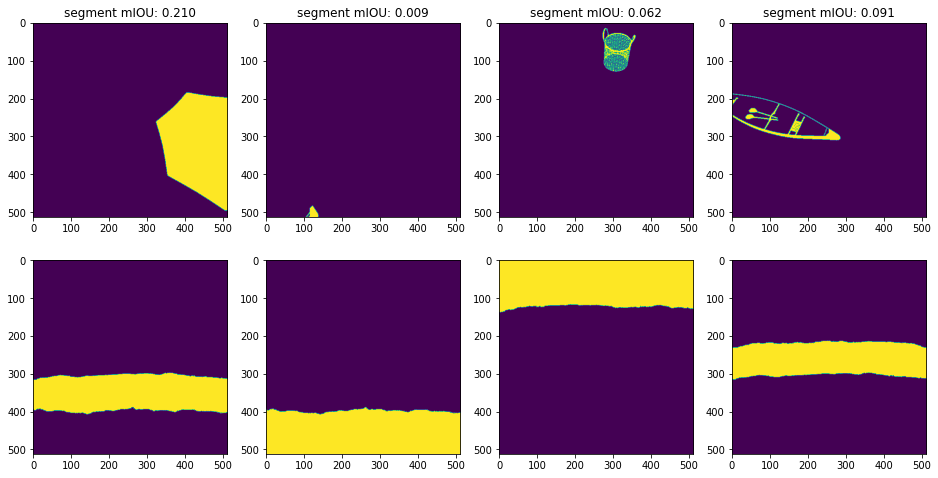

list index out of range


In [72]:
model.eval()
model.cuda()
all_mious = []
for i, (image, segment_map, gt_moving, raft_moving) in tqdm(enumerate(dataset)):
    image = image.cuda().unsqueeze(0) / 255.
    recon_combined, recons, masks, slots = model(image)
    
    recon_combined = recon_combined.squeeze(0)
    recon_combined = recon_combined.permute(1,2,0)
    recon_combined = recon_combined.cpu().detach().numpy()
    
    recons = recons.squeeze(0)
    recons = recons.cpu().detach().numpy()
    
    og_masks = masks.squeeze(0)
    
    masks = masks.squeeze(0)
    masks = masks.cpu().detach() > 0.5
    masks = torch.cat([torch.zeros((1, 512, 512, 1)), masks], 0) 
    masks = masks.argmax(dim=0).unsqueeze(0).type(torch.int32)
    
    image = image.squeeze().permute(1,2,0).cpu().numpy()
    
    gt_masks = segment_map.unsqueeze(0).type(torch.int32)
#     gt_masks = gt_masks.float()
#     gt_masks = torch.cat([torch.zeros((1, 512, 512)), gt_masks], 0)
#     gt_masks = gt_masks.argmax(dim=0).unsqueeze(0).type(torch.int32)    
            
    metric = SegmentationMetrics(gt_masks, masks)
    metric.compute_matched_IoUs(exclude_gt_ids=[0])
    
    miou = np.mean(metric.mean_ious)
    pred, gt, iou = metric.seg_out
    all_mious.append(miou)
    
    if i % 25 == 0:
        fig, axs = plt.subplots(1, 2, figsize=(16, 12))
        axs[0].imshow(image)
        axs[0].set_title("Ground Truth")
        axs[1].imshow(recon_combined[:, :, :3])
        axs[1].set_title("Reconstruction")
        plt.show()
        
        t = og_masks.detach().cpu().numpy()
        fig, axs = plt.subplots(1, t.shape[0], figsize=(16,10), sharex=True, sharey=True)
        for i in range(t.shape[0]):
            axs[i].imshow(t[i])
        axs[2].set_title("Masks")
        plt.show()
        
        print("Mean IOU:", metric.mean_ious, "Best IOUs: ", metric.best_ious)
        #pred_masks, pred_boxes, scores = vis_utils.process_predictions(predictions[0], alpha)
        fig, (ax1, ax2) = plt.subplots(2, 4, figsize=(16, 8))
        for k in range(len(pred[0])):
            ax1[k].imshow(gt[0][k])
            ax2[k].imshow(pred[0][k])
            ax1[k].set_title(f"segment mIOU: {iou[0][k]:.3f}")
        plt.show()
        

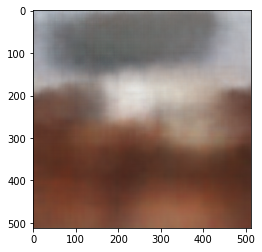

In [26]:
plt.imshow(recon_combined[:, :,:3]

In [12]:
if "flow" in run_name:
    raft_mean = np.mean(all_mious)
    res = raft_mean
else:
    rgb_all_mean = np.mean(all_mious)
    res = rgb_all_mean
    
print(res)    

0.17671875151003139


In [30]:
print(rgb_all_mean, raft_mean)

0.13748598735813358 0.1249331389046262


In [ ]:

fig, ax = plt.subplots(1, num_slots + 2, figsize=(15, 2))
image = image.squeeze(0)
recon_combined = recon_combined.squeeze(0)
recons = recons.squeeze(0)
masks = masks.squeeze(0)
image = image.permute(1,2,0).cpu().numpy()
recon_combined = recon_combined.permute(1,2,0)
recon_combined = recon_combined.cpu().detach().numpy()
recons = recons.cpu().detach().numpy()
masks = masks.cpu().detach().numpy()
ax[0].imshow(image)
ax[0].set_title('Image')
ax[1].imshow(recon_combined)
ax[1].set_title('Recon.')
for i in range(7):
  picture = recons[i] * masks[i] + (1 - masks[i])
  ax[i + 2].imshow(picture)
  ax[i + 2].set_title('Slot %s' % str(i + 1))
for i in range(len(ax)):
  ax[i].grid(False)
  ax[i].axis('off')